# Dot-Product Attention

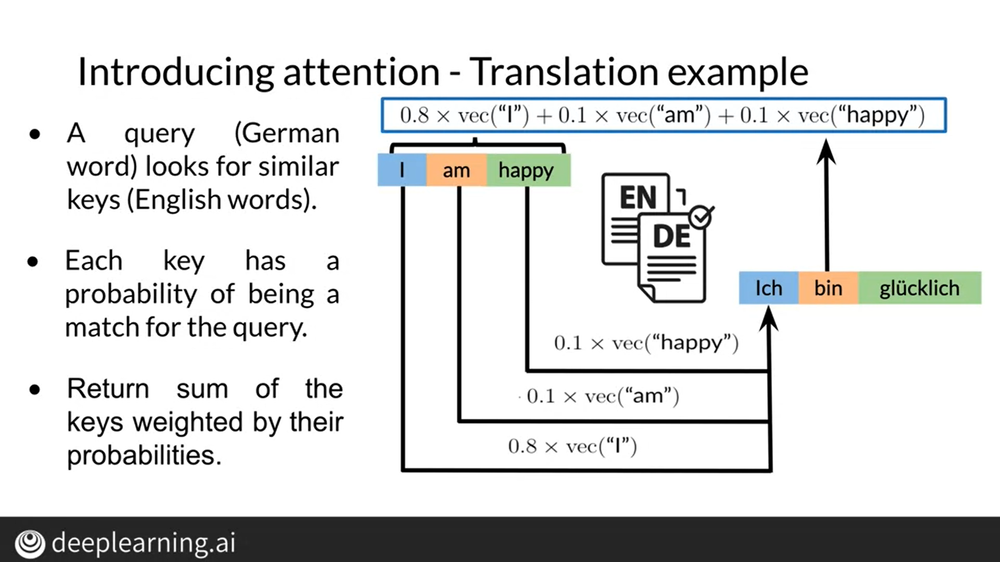


 In an attention layer, the German word vectors are called queries. Because they initiate the look up, a query is matched against all keys and each guy gets probability that it's a match for the query. 

Then you can compare the word am with the word Ich and finally you can compare the word happy with the word Ich. These queries by keys matrix is often called attention weights and it says how much each key is similar to each query.

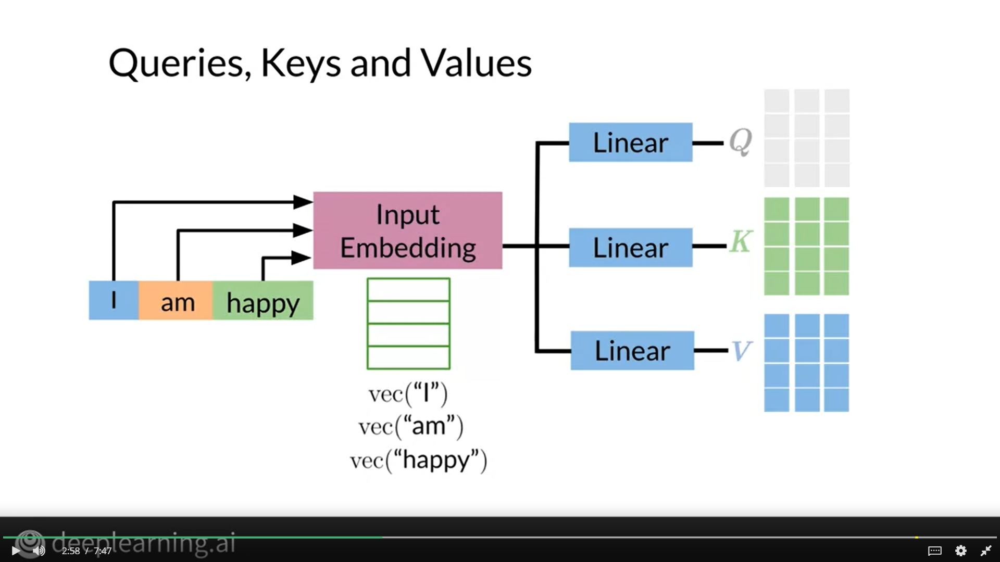

* Before you dive into the concept of attention, you need to first define three main matrices, capital Q, which stands for queries, capital K which stands for Keys and Capital V, which stands for values. 
* So understand how to create these matrices. Let's consider the phrase in English, I am happy. First, the word I is embedded, to obtain a vector representation that holds continuous values which is unique for every single word as seen earlier in the course. By feeding three distinct linear layers, you get three different vectors for queries, keys and values.
* Then you can do the same for the word am to output a second vector. And finally the word happy to get a third vector and form the queries, keys and values matrix. `From both the capital Q matrix and the capital K matrix and attention model calculates weights or scores representing the relative importance of the keys for a specific query. `
* `These attention weights can be understood as alignments course as they come from a dot product`. Additionally, to turn these weights into probabilities, a softmax function is required.

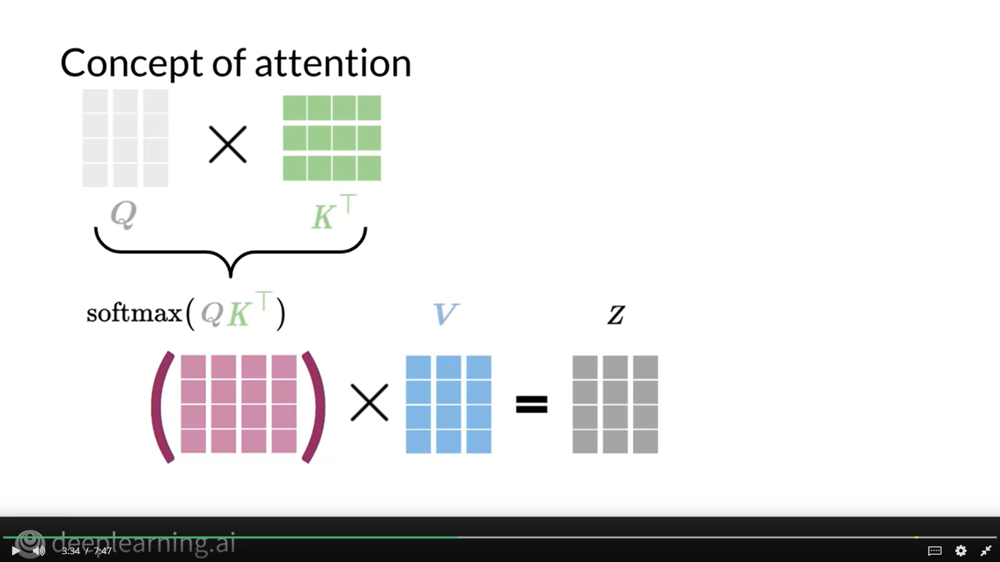


Finally, multiplying these probabilities with the values, you will then get a weighted sequence, which is the attention results itself. 

And the queries as the embeddings of German words. Then D is the dimensionality of word embeddings. LQ, the length of the English sentence and LQ, number of words of the German senses. So queries are a tensor Q of shape LQ by D and keys have a shape LK by D. As I said before, a query Q will assign each key a probability that the key K is a match for Q. You measure the similarity by taking those products of vectors. So Q and K are similar if Q dot K is large. However, the similarity numbers do not add up to one, so they cannot be used as probabilities. To make them so and to make attention more focused on the best matching keys, use the softmax. So you compute the matrix of query key probabilities, often called the attention weights, just as softmax of between Q&K transpose. This matrix has shaped LQ by LK.

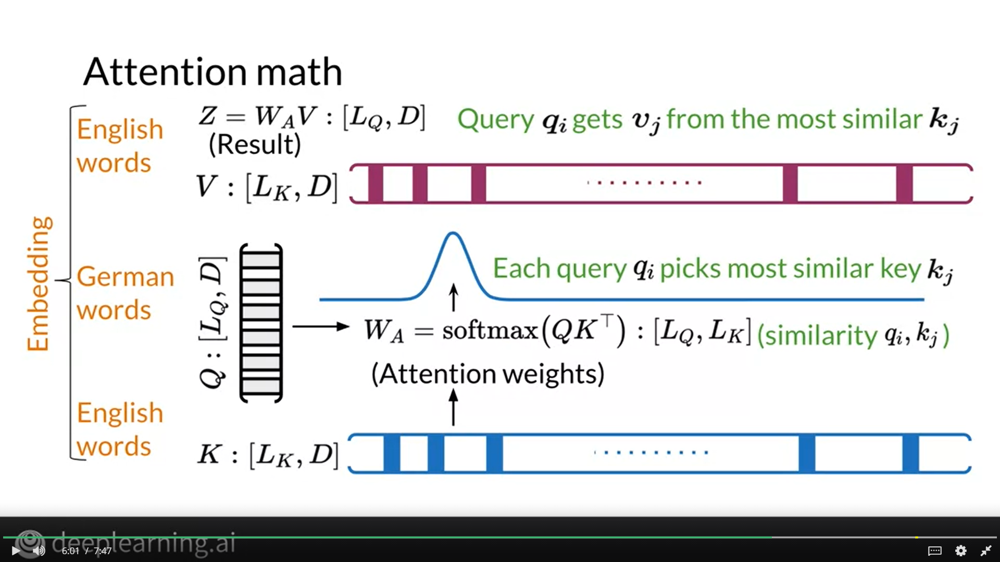

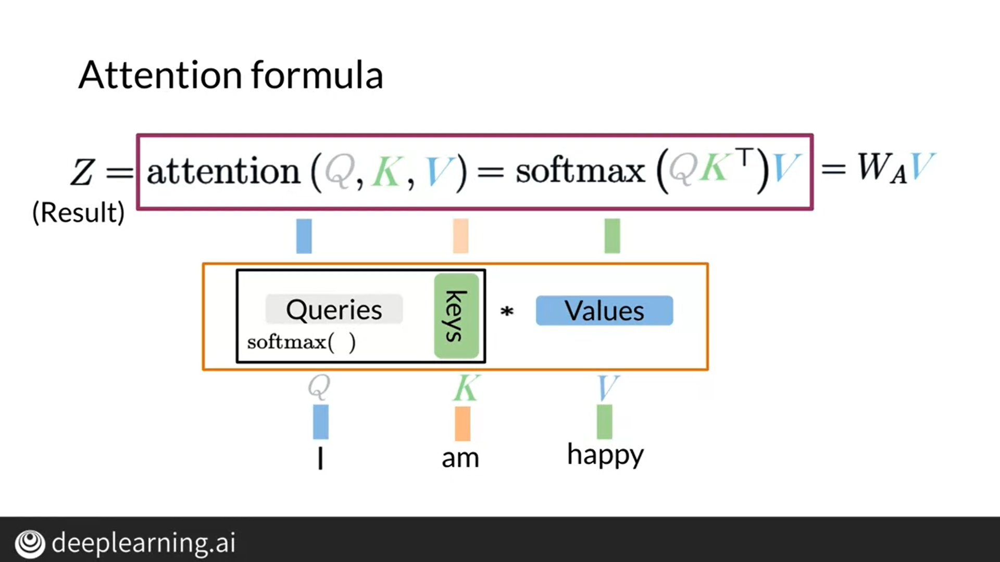

Modern hardware such as GPUs and CPUs are very fast as matrix multiplication, which makes attention very fast and such a great operation to use. Dot-product Attention is the heart and soul of transformers.

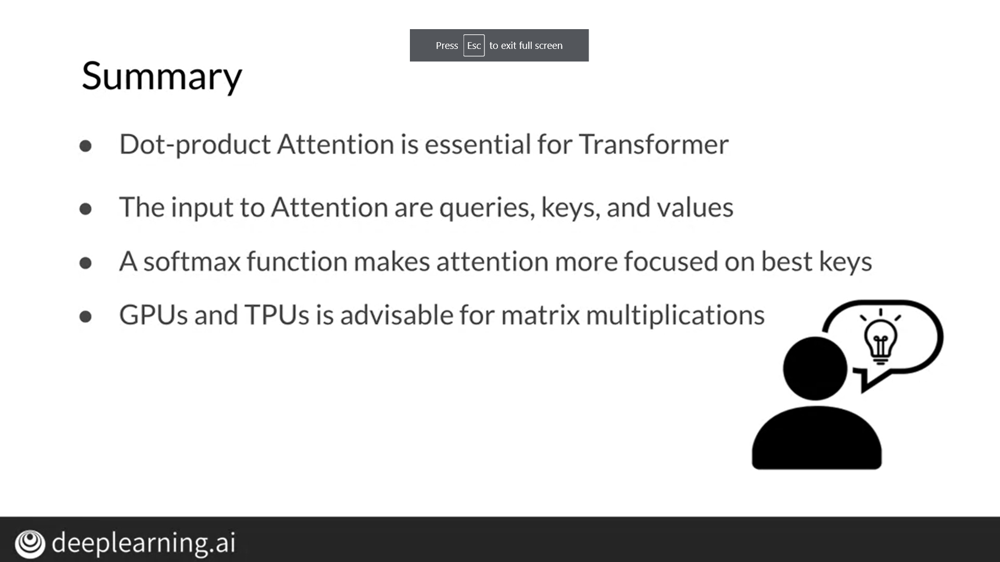

# Causal Attention


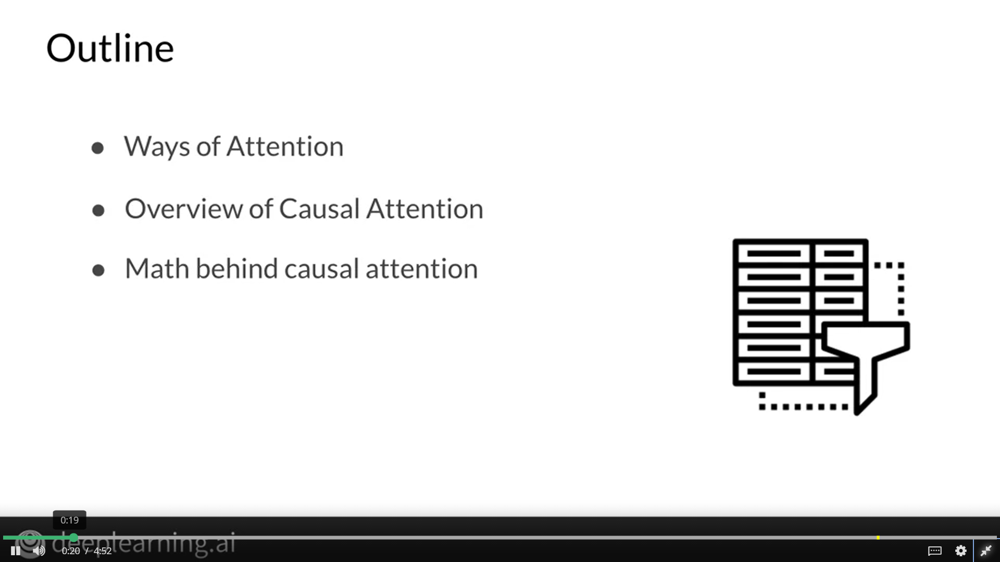

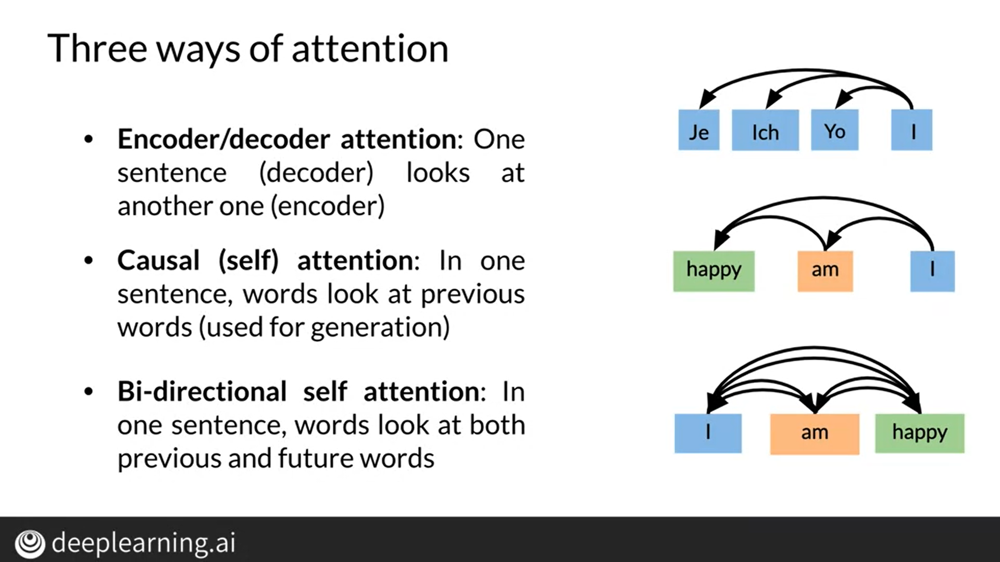

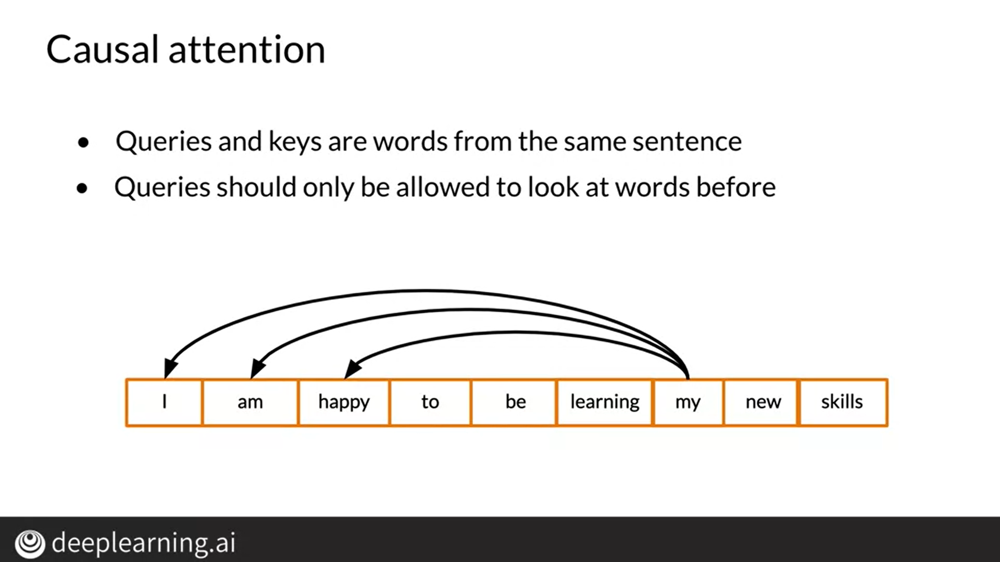

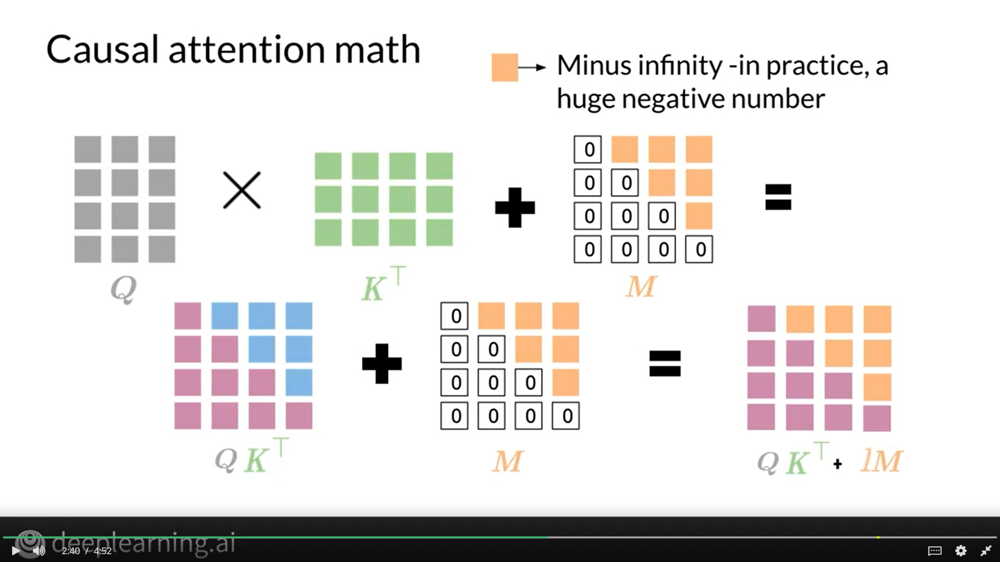

let's recall the dot-product attention, which requires the calculation of capital Q over here, times capital K transpose.

And then this gives you your weights course, so Q K transpose. These weights are added to a constant matrix which is called mask, and it's a triangular matrix. It has 0s on the diagonal and below it, and minus infinity, or in practice just a huge negative number in all other places. So you get the new weights as Q times K transpose + M.

So how does the math of attention change for the causal version? As you saw previously, you just need to add what is called a mask. Let me elaborate further. Remember that queries, keys and values are eigenvectors of dimension D

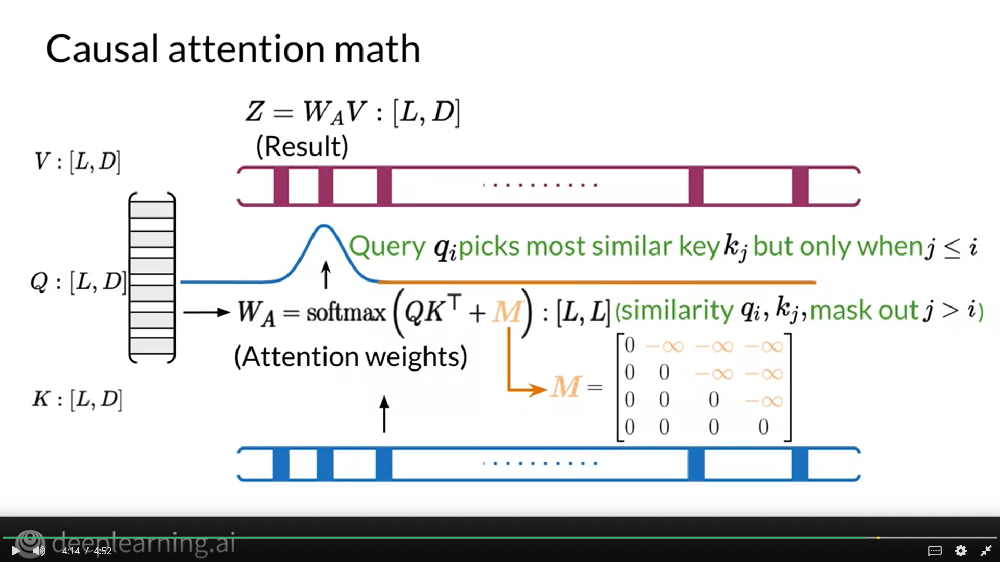

But that way, you are allowing the model to attend to words in the future. To solve this issue, you add a mask by a sum of size L by L. So you compute softmax of Q times K transpose + M. When you add M to Q times K transpose, all values on the diagonal and below which correspond to queries attending words in the past are untouched. All other values become minus infinity. After a softmax, all minus infinities will become equal to 0, as exponents of negative infinity is equal to 0, so it prevents words from attending to the future. The final formula for causal attention is therefore very similar to the attention formula you've learned in the previous video. I was adding an additional M term so that the attention becomes softmax of Q times K transpose + M times V, is still very fast to compute, and as you'll see it does the trick. 

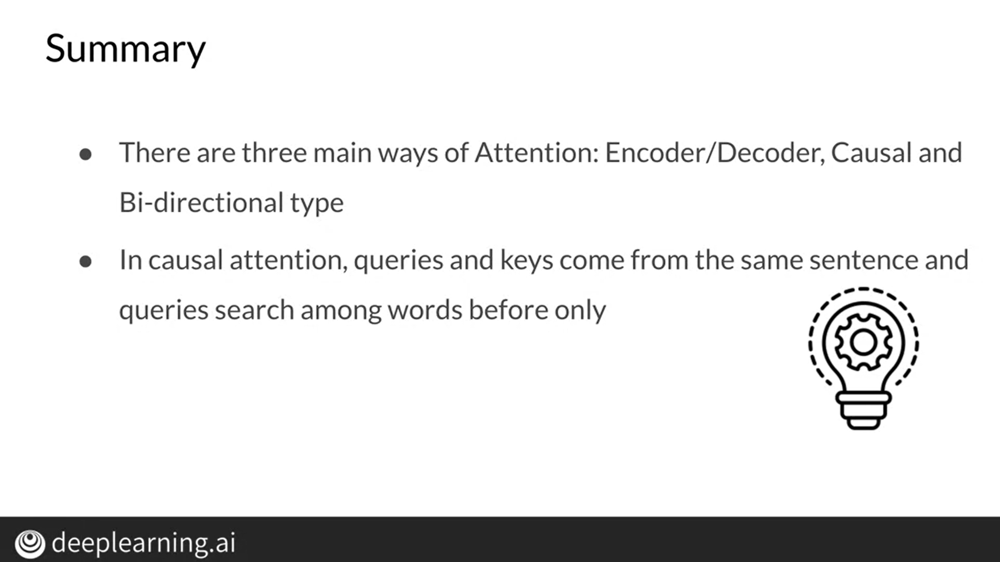

# Multi-head Attention

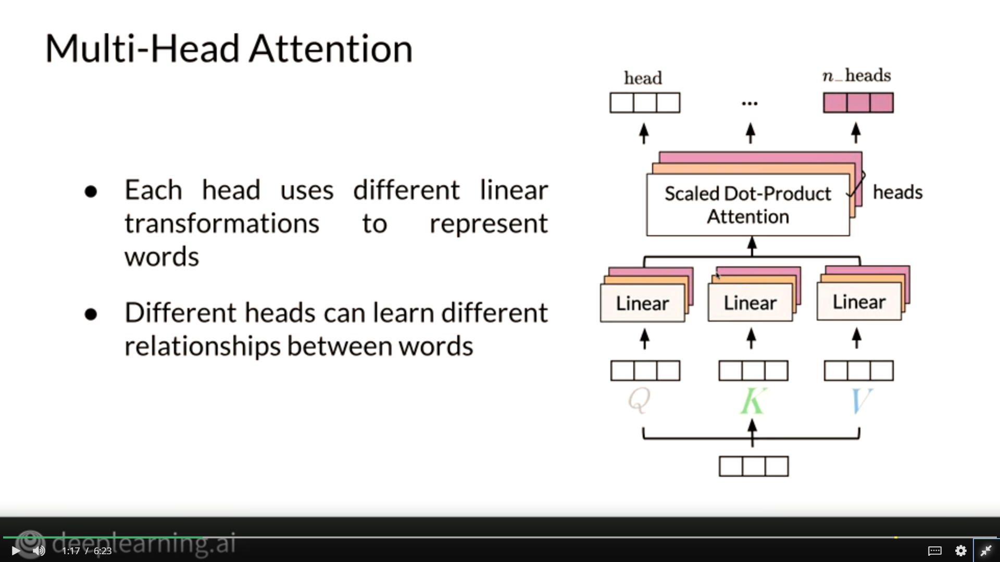

Let me show you how multi-headed attention achieves multiple lookups in parallel.
* The input to multi-head attention again is a triple Q, K, V. So query, key and value. 
* To achieve the multiple lookups, you first use a fully-connected, dense linear layer on each query, key, and value. This layer will create the representations for parallel attention heads. 
* Here, you split these vectors into number of heads and perform attention on them as each head was different. Then the result of the attention will be concatenated back together, and put through a final fully connected layer. 
* The scale dot-product is the one used in the dot-product attention model except by the scale factor, one over square root of DK. DK is the key inquiry dimension.
* It's normalization prevents the gradients from the function to be extremely small when large values of D sub K are used.

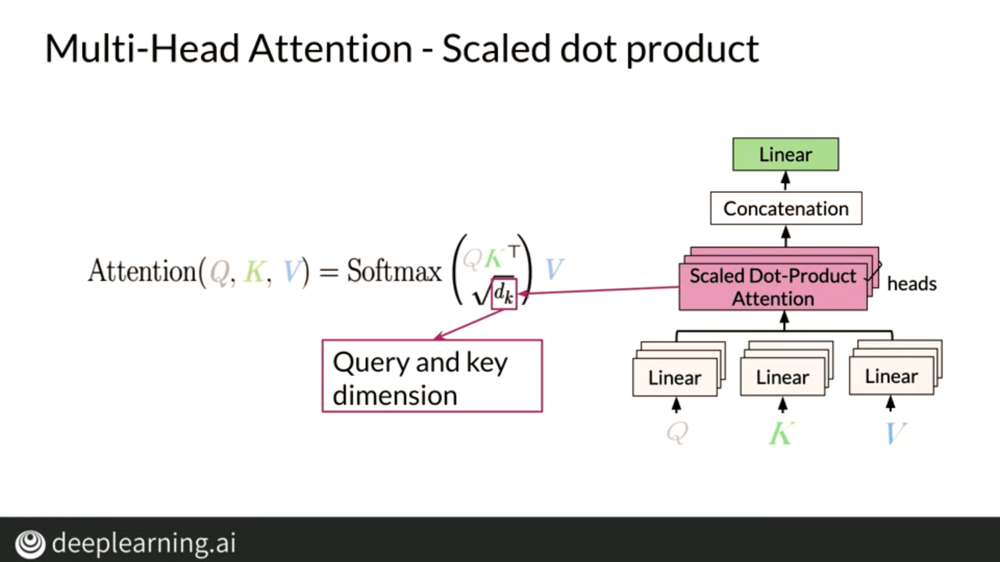

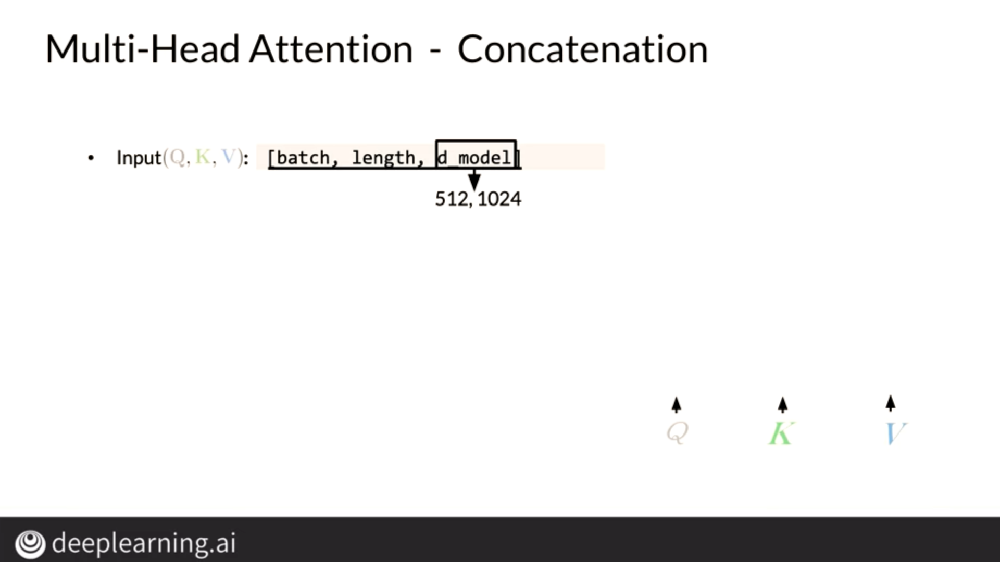

* N heads is the number of parallel attention heads, often four, eight or even 16 or more. While D head is the dimensionality of the vector for each head, very often 64 or 128. So the linear layer creates a set of N head vectors, each of size D head.
* To apply attention on all heads in parallel, you transpose the N heads parts just after the batch dimension so it can be treated in the same way as batch

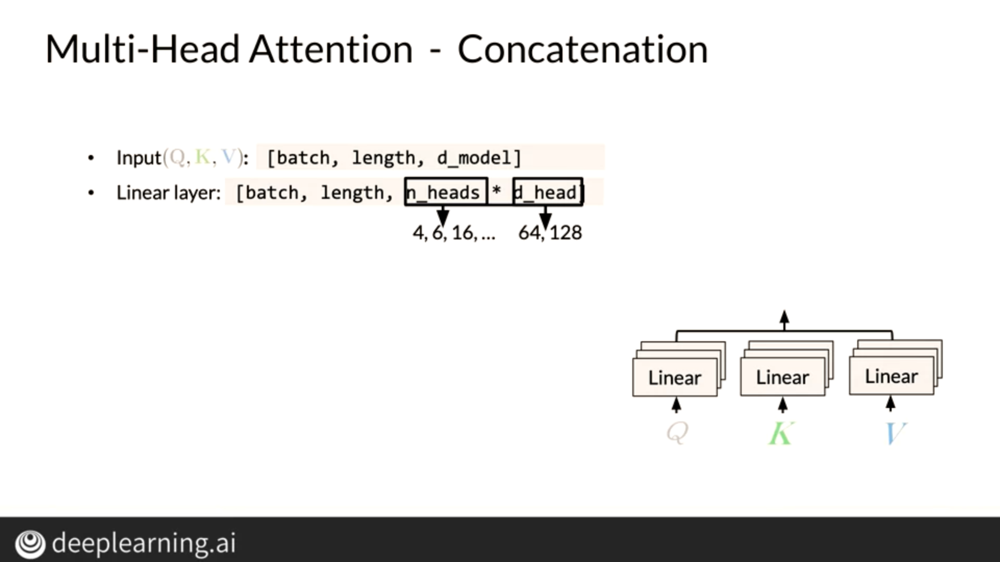

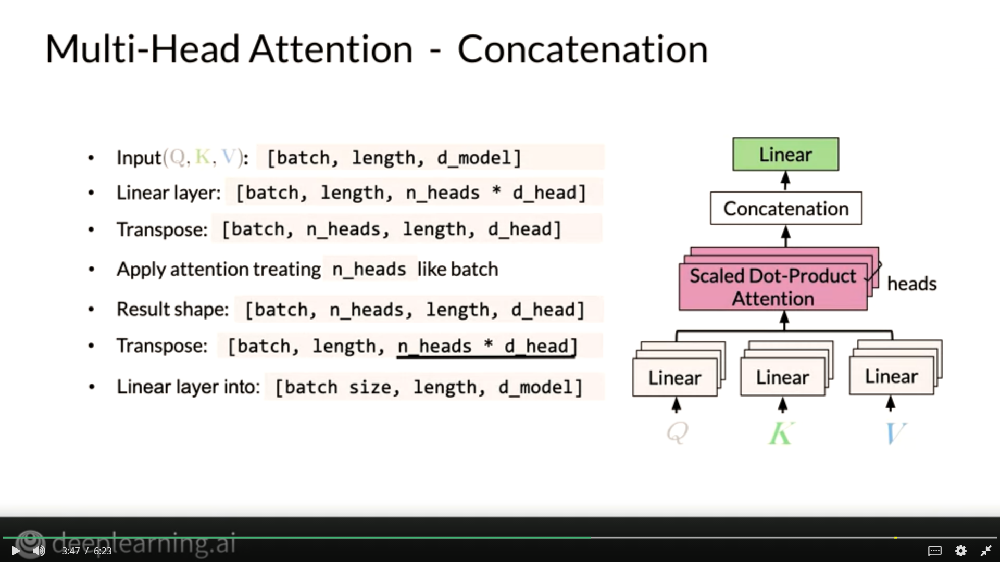

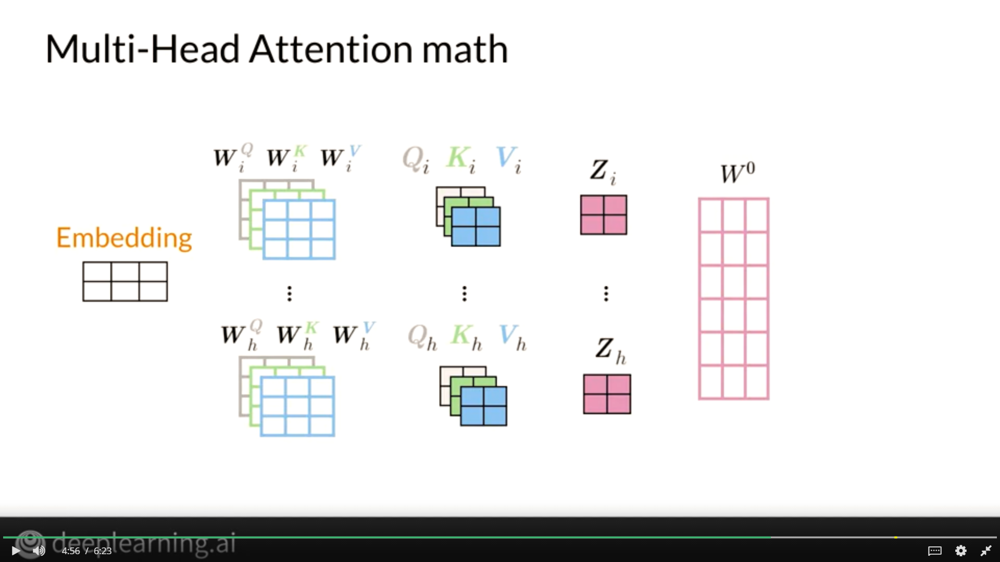

* To understand the math behind multi-head attention, let's see this step-by-step explanation.
* As any conventional attention model, you first need to create the embedding of the input words.
* Next, you calculate the queries, keys and value matrices, capital Q, capital K, and capital V.
* This is done by packing all the embeddings into a matrix for every head, from one to H heads. Then you train weight matrices one per head to obtain new weighted queries, keys and values as capital W superscripts Q, capital W superscript K and capital W superscript V.
* Note that the subscripts I tells you that this corresponds to the ith head. With these weighted queries, keys and value matrices, you calculate the results matrix capital Z subscript I from I equals one to H, where H is the number of heads. 
* Finally, by multiplying by the outputs weight, matrix capital W, superscript 0, you obtain the output layer Z.

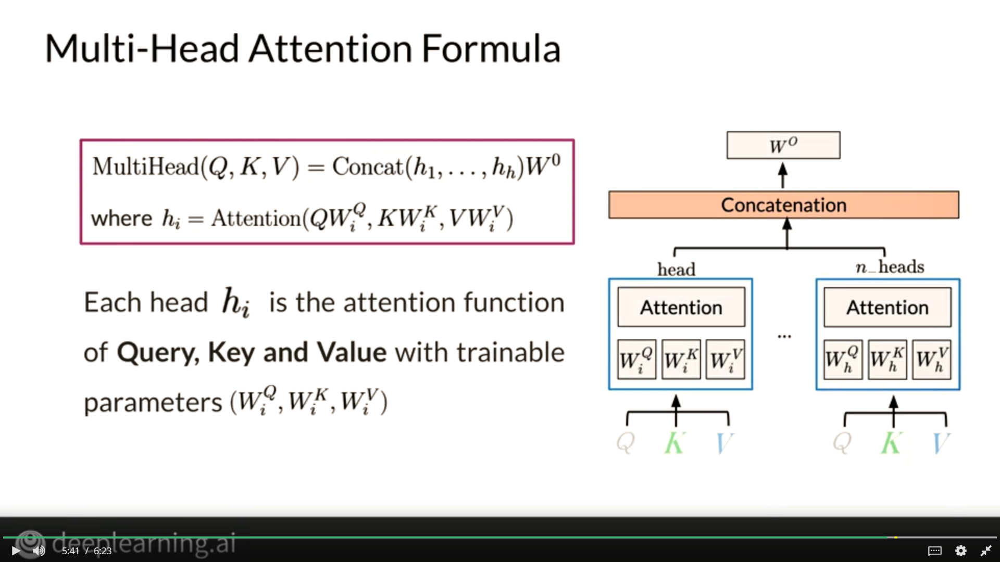

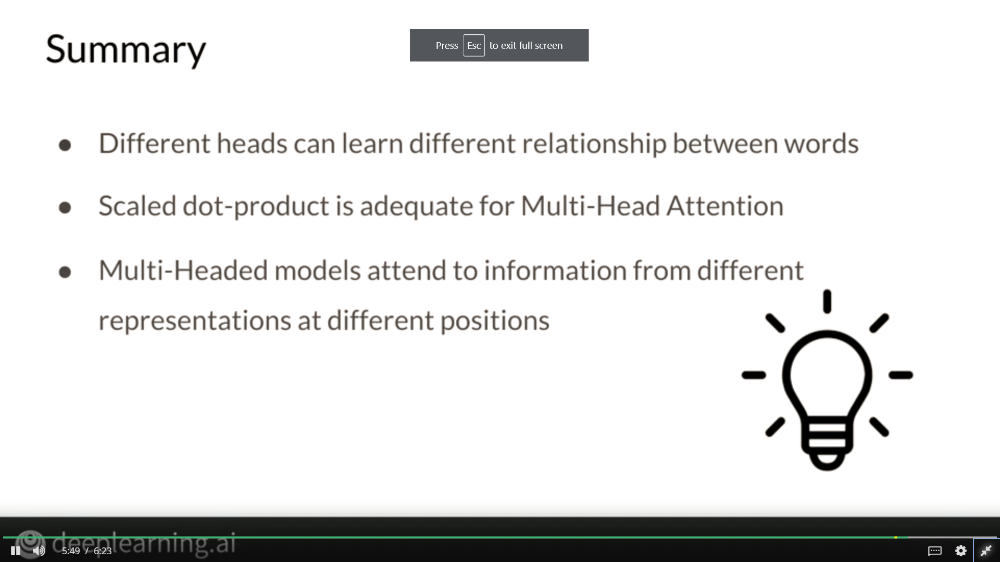